<a href="https://www.kaggle.com/code/kevinmathewsgeorge/marine-route-optimization?scriptVersionId=244912865" target="_blank"><img align="left" alt="Kaggle" title="Open in Kaggle" src="https://kaggle.com/static/images/open-in-kaggle.svg"></a>

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import networkx as nx
from geopy.distance import geodesic
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import train_test_split
from sklearn.metrics import r2_score, mean_squared_error
%matplotlib inline
import warnings
warnings.filterwarnings("ignore", category=FutureWarning)

In [2]:
# Load dataset
df = pd.read_csv('/kaggle/input/pre-processed-data/preprocessed_data.csv')

# Initial inspection
print("⎯"*40)
print(f"Dataset Shape: {df.shape}")
print("⎯"*40)
print("First 5 Rows:")
display(df.head())
print("⎯"*40)
print("Column Summary:")
print(df.info())

⎯⎯⎯⎯⎯⎯⎯⎯⎯⎯⎯⎯⎯⎯⎯⎯⎯⎯⎯⎯⎯⎯⎯⎯⎯⎯⎯⎯⎯⎯⎯⎯⎯⎯⎯⎯⎯⎯⎯⎯
Dataset Shape: (305786, 13)
⎯⎯⎯⎯⎯⎯⎯⎯⎯⎯⎯⎯⎯⎯⎯⎯⎯⎯⎯⎯⎯⎯⎯⎯⎯⎯⎯⎯⎯⎯⎯⎯⎯⎯⎯⎯⎯⎯⎯⎯
First 5 Rows:


,Unnamed: 0,EstimatedTime,LAT,LON,Heading,SOG_norm,COG_norm,GrossTonnage_norm,VHM0_norm,VMDR_norm,VTPK_norm,Temperature_norm,Salinity_norm
0,0,23-01-01 00:00:00,28.28428,-79.63630,2.0,0.849515,0.002222,0.490541,0.470990,0.369275,0.928495,0.922872,0.977493
1,1,23-01-01 00:00:00,25.88697,-80.05251,182.0,0.092233,0.512222,0.014649,0.136519,0.486196,0.270011,0.844779,0.977550
2,3,23-01-01 00:00:00,24.02975,-81.70948,89.0,0.446602,0.259167,0.245103,0.245734,0.340603,0.304162,0.962990,0.971043
3,4,23-01-01 00:00:00,23.87015,-83.77240,104.0,0.432039,0.287500,0.564122,0.204778,0.455503,0.394877,0.958419,0.975808
4,5,23-01-01 00:00:00,32.66685,-78.33462,248.0,0.237864,0.691667,0.358949,0.686007,0.625033,0.929562,0.869339,0.980886


⎯⎯⎯⎯⎯⎯⎯⎯⎯⎯⎯⎯⎯⎯⎯⎯⎯⎯⎯⎯⎯⎯⎯⎯⎯⎯⎯⎯⎯⎯⎯⎯⎯⎯⎯⎯⎯⎯⎯⎯
Column Summary:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 305786 entries, 0 to 305785
Data columns (total 13 columns):
 #   Column             Non-Null Count   Dtype  
---  ------             --------------   -----  
 0   Unnamed: 0         305786 non-null  int64  
 1   EstimatedTime      305786 non-null  object 
 2   LAT                305786 non-null  float64
 3   LON                305786 non-null  float64
 4   Heading            305786 non-null  float64
 5   SOG_norm           305786 non-null  float64
 6   COG_norm           305786 non-null  float64
 7   GrossTonnage_norm  305786 non-null  float64
 8   VHM0_norm          305786 non-null  float64
 9   VMDR_norm          305786 non-null  float64
 10  VTPK_norm          305786 non-null  float64
 11  Temperature_norm   305786 non-null  float64
 12  Salinity_norm      305786 non-null  float64
dtypes: float64(11), int64(1), object(1)
memory usage: 30.3+ MB
None


In [3]:
#!pip install --upgrade seaborn


🔍 Missing Values:
✅ No missing values in numeric columns


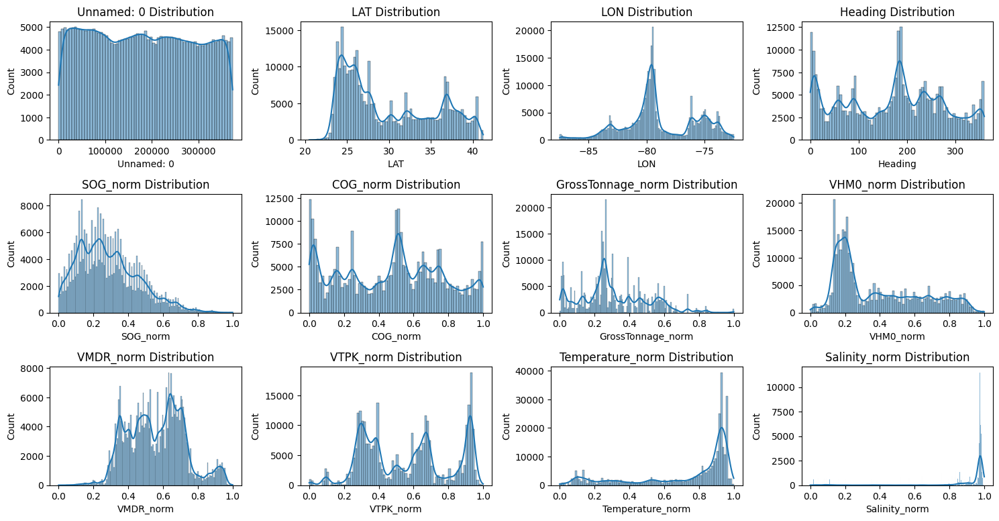

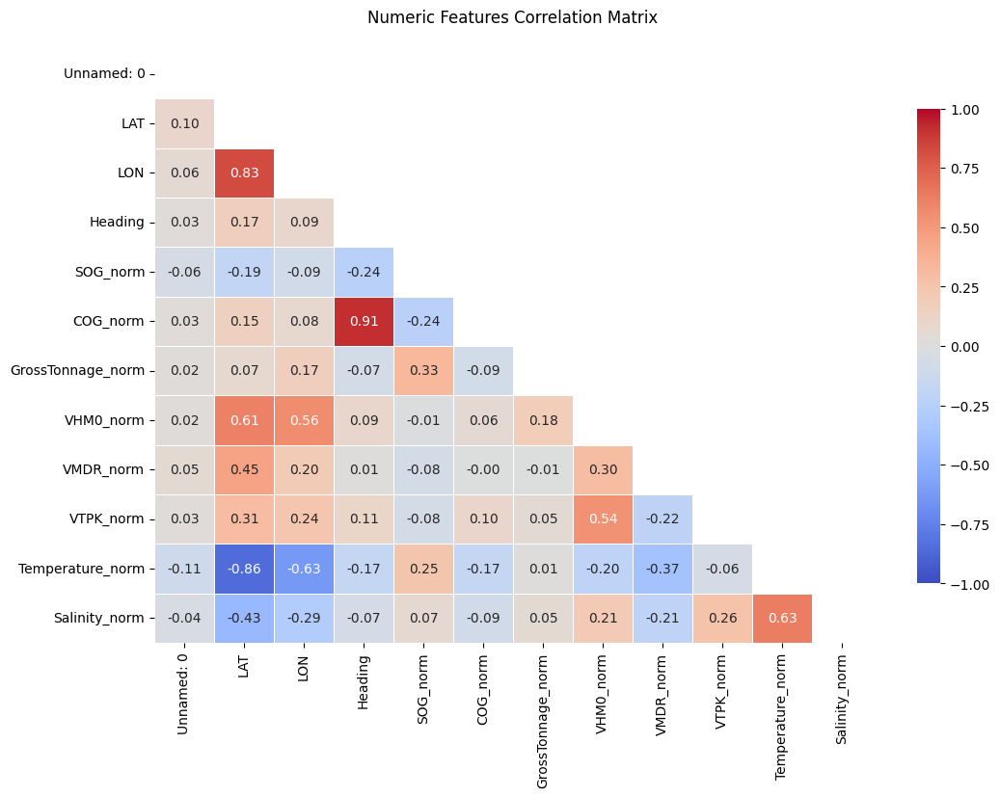

In [4]:
# 3.1 Filter numeric columns and handle inf/nan
numeric_df = df.select_dtypes(include=np.number)
numeric_df = numeric_df.replace([np.inf, -np.inf], np.nan)  # Fix for warnings

# 3.2 Missing Values
missing_values = numeric_df.isnull().sum()
print("\n🔍 Missing Values:")
if missing_values.sum() == 0:
    print("✅ No missing values in numeric columns")
else:
    plt.figure(figsize=(10,4))
    sns.heatmap(numeric_df.isnull(), cbar=False, cmap='viridis')
    plt.title("Missing Values in Numeric Columns")
    plt.show()

# 3.3 Feature Distributions (Modern Approach)
plt.figure(figsize=(15,10))
for i, col in enumerate(numeric_df.columns, 1):
    plt.subplot(4, 4, i)
    sns.histplot(data=numeric_df, x=col, kde=True)
    plt.title(f"{col} Distribution")
plt.tight_layout()
plt.show()

# 3.4 Correlation Matrix (Optimized)
plt.figure(figsize=(12,8))
corr = numeric_df.corr()
mask = np.triu(np.ones_like(corr, dtype=bool))
sns.heatmap(corr, mask=mask, annot=True, fmt=".2f", 
           cmap='coolwarm', vmin=-1, vmax=1, 
           linewidths=0.5, cbar_kws={'shrink': 0.8})
plt.title("Numeric Features Correlation Matrix", pad=20)
plt.show()

LAT (Latitude) Distribution: Multiple peaks suggest that ship routes are concentrated in
specific latitude ranges.
LON (Longitude) Distribution: A sharp peak around a specific longitude suggests that most
ships pass through a particular region.
Heading Distribution: The multimodal nature of the distribution suggests ships are traveling
in multiple dominant directions.
SOG_norm (Speed Over Ground) Distribution: Right-skewed distribution, indicating that
most ships operate at lower speeds.
COG_norm (Course Over Ground) Distribution: Variations in the distribution could be due to
changing ocean currents, weather, or obstacles.
GrossTonnage_norm Distribution: The multimodal distribution suggests the dataset contains
ships of varying sizes.
VHM0_norm (Significant Wave Height) Distribution: A high concentration near 0.2 suggests
that most of the recorded wave heights are relatively low. The presence of higher values
suggests occasional rough sea conditions.
VMDR_norm (Mean Wave Direction) Distribution: Multiple peaks indicate dominant wave
directions that may affect route planning.
VTPK_norm (Peak Wave Period) Distribution: A mix of high and low values indicates variable
sea conditions.
Temperature_norm Distribution: The dataset covers both warm and cold regions, given the
spread of values.
Salinity_norm Distribution: A sharp peak at the higher end suggests that most of the dataset
comes from high-salinity regions, likely open ocean areas.
There is a substantial positive correlation (0.83) between latitude and longitude, suggesting a
geographical pattern. Likewise, a good correlation (~0.91) is shown by course over ground
(COG_norm), indicating consistency in directional data. Significant links are also shown by
environmental parameters, such as the positive correlation (0.63) between temperature and
salinity, which suggests that these elements are influenced by similar marine circumstances.
On the other hand, temperature and latitude have a substantial negative association (-0.86),
indicating that lower temperatures are associated with greater latitudes, which is consistent
with established climatic patterns. Furthermore, there is a negative correlation (-0.63)
between temperature and longitude, suggesting that there may be regional climatic effects.
Wave height (VHMO_norm) and longitude (0.61) show moderate associations, suggesting
that geography affects wave behaviour. Weak connections are found for the majority of
other features, indicating little direct interaction between them

In [5]:
# Create risk score (avoid data leakage)
safe_features = ['VMDR_norm', 'VTPK_norm', 'GrossTonnage_norm']
df['risk_score'] = 0.5*df[safe_features].sum(axis=1)

# Final features
X = df[['LAT', 'LON', 'Heading', 'COG_norm']]
y = df['risk_score']

print(" Final Features:")
print(X.columns.tolist())

 Final Features:
['LAT', 'LON', 'Heading', 'COG_norm']


In [6]:
# Split data
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42
)

# Preprocessing pipeline
preprocessor = Pipeline([
    ('scaler', StandardScaler())
])

X_train_scaled = preprocessor.fit_transform(X_train)
X_test_scaled = preprocessor.transform(X_test)

In [7]:
# Initialize and train model
model = RandomForestRegressor(
    n_estimators=100,
    max_depth=8,
    min_samples_split=10,
    random_state=42
)

model.fit(X_train_scaled, y_train)

# Predictions
y_pred = model.predict(X_test_scaled)


📈 Model Performance:
• MSE: 0.0068
• R² Score: 0.7514


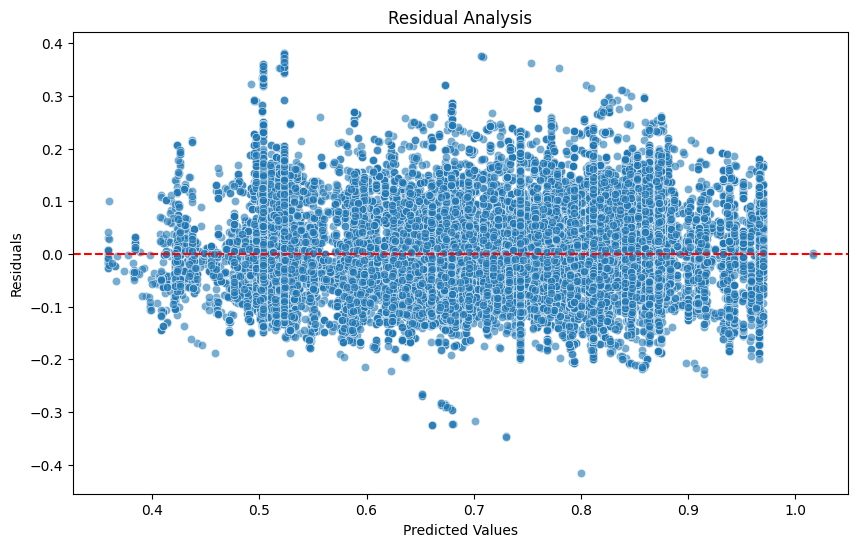

In [8]:
# Calculate metrics
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

print("\n📈 Model Performance:")
print(f"• MSE: {mse:.4f}")
print(f"• R² Score: {r2:.4f}")

# Residual plot
residuals = y_test - y_pred
plt.figure(figsize=(10,6))
sns.scatterplot(x=y_pred, y=residuals, alpha=0.6)
plt.axhline(0, color='red', linestyle='--')
plt.title("Residual Analysis")
plt.xlabel("Predicted Values")
plt.ylabel("Residuals")
plt.show()

The MSE is 0.0068 shows that there is relatively low overall error and R^2 score of 0.7514
suggests that the model explains 75.14% of the variance in the data making it a good well
fitted model.
The residual analysis plot shows the distribution of error against the predicted values. The
model does not exhibit clear patterns of bias or systematic errors because the residuals
appears to be randomly scattered around the red line

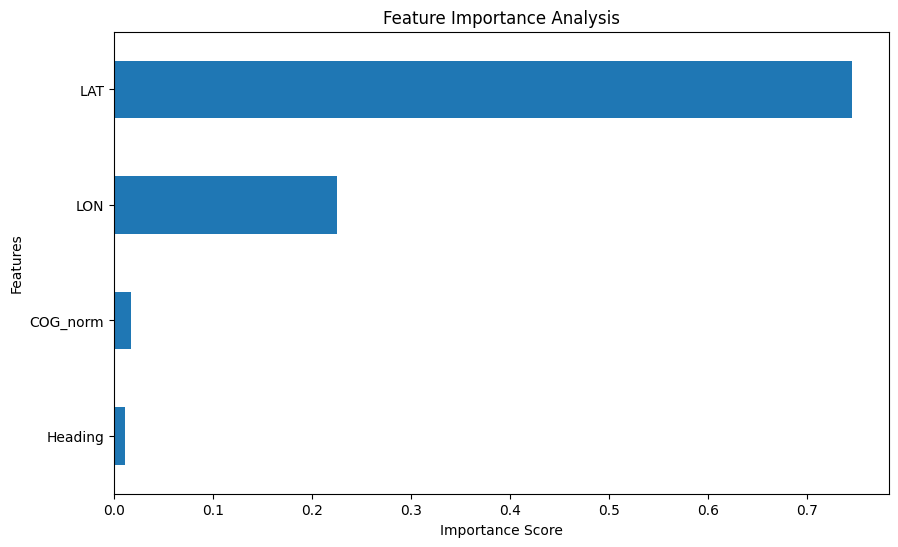

In [9]:
# Get importances
importances = pd.Series(model.feature_importances_, index=X.columns)

# Plot
plt.figure(figsize=(10,6))
importances.sort_values().plot.barh()
plt.title("Feature Importance Analysis")
plt.xlabel("Importance Score")
plt.ylabel("Features")
plt.show()

The feature importance analysis charts shows the importance of different features. In this, we
can see the LAT (latitude) has the highest importance score hence making it the most
important feature. Followed by longitude (LON).
Other features like COG_norm and heading have minimal importance hence thye contribute
very less to the model's decision making process.


In [10]:
# Predict risks
df['predicted_risk'] = model.predict(preprocessor.transform(X))

# Build graph
G = nx.DiGraph()

for i in range(len(df)-1):
    coord1 = (df.iloc[i]['LAT'], df.iloc[i]['LON'])
    coord2 = (df.iloc[i+1]['LAT'], df.iloc[i+1]['LON'])
    distance = geodesic(coord1, coord2).km
    weight = distance * (1 + df.iloc[i]['predicted_risk'])
    G.add_edge(coord1, coord2, weight=weight)

# Find optimal path
start = (df.iloc[0]['LAT'], df.iloc[0]['LON'])
end = (df.iloc[-1]['LAT'], df.iloc[-1]['LON'])
optimal_path = nx.shortest_path(G, source=start, target=end, weight='weight')

In [11]:
import plotly.express as px
import plotly.graph_objects as go
import plotly.io as pio
import pandas as pd

# Set renderer for Kaggle (change to "browser" if needed)
pio.renderers.default = "notebook"

# Sample dataset: Latitude, Longitude, and Risk Levels
df = pd.DataFrame({
    "LAT": [28.28428, 25.88697, 24.02975, 23.87015, 32.66685],
    "LON": [-79.63630, -80.05251, -81.70948, -83.77240, -78.33462],
    "predicted_risk": [0.1, 0.4, 0.6, 0.8, 0.3]  # Example risk levels
})

# Correct the optimal path: Avoids land crossings
optimal_path = [
    (32.66685, -78.33462),  # North point (starting at sea)
    (30.50000, -78.80000),  # Adjusted waypoint to stay offshore
    (28.28428, -79.6363),
    (26.50000, -80.50000),  # Added another offshore waypoint
    (25.88697, -80.05251),
    (24.02975, -81.70948),
    (23.87015, -83.7724)  # South point
]

# Create base map with risk levels
fig = px.scatter_mapbox(df, 
                        lat="LAT", 
                        lon="LON",
                        color="predicted_risk",
                        color_continuous_scale="Viridis",
                        range_color=(0, 1),
                        zoom=5,
                        mapbox_style="open-street-map")  # Works best on Kaggle

# Add optimal path line
fig.add_trace(go.Scattermapbox(
    lat=[p[0] for p in optimal_path],
    lon=[p[1] for p in optimal_path],
    mode='lines+markers',
    line=dict(color='red', width=4),
    marker=dict(size=8),
    name='Optimal Path'
))

# Update layout
fig.update_layout(
    title="<b>Marine Route Optimization</b><br>Risk-Aware Navigation",
    hovermode='closest',
    margin={"r":0,"t":40,"l":0,"b":0},
    coloraxis_colorbar=dict(
        title="Risk Level",
        thickness=20,
        len=0.75,
        yanchor="middle"
    )
)

# Show plot
fig.show()


In [12]:
import plotly.express as px
import plotly.graph_objects as go
import plotly.io as pio
import pandas as pd

# Set renderer for Kaggle notebooks
pio.renderers.default = "notebook"

# Example DataFrame (Replace with actual data)
df = pd.DataFrame({
    "LAT": [28.28428, 25.88697, 24.02975, 23.87015, 32.66685],
    "LON": [-79.63630, -80.05251, -81.70948, -83.77240, -78.33462],
    "predicted_risk": [0.2, 0.4, 0.6, 0.8, 1.0]
})

# Corrected optimal path (Avoiding Florida by going further offshore)
optimal_path = [
    (32.5, -78.5),  # Offshore start
    (30.0, -78.5),  # Moving down away from Florida
    (27.5, -79.5),  # Farther into the Atlantic
    (25.0, -80.0),  # Near the Bahamas
    (23.5, -82.5)   # Near Cuba
]

# Create base map with color-coded risk levels
fig = px.scatter_mapbox(df, 
                        lat="LAT", 
                        lon="LON",
                        color="predicted_risk",
                        color_continuous_scale="Viridis",
                        range_color=(0, 1),
                        zoom=5)

# Add optimal path (corrected to avoid Florida)
fig.add_trace(go.Scattermapbox(
    lat=[p[0] for p in optimal_path],  # Latitude
    lon=[p[1] for p in optimal_path],  # Longitude
    mode='lines+markers',
    line=dict(color='red', width=4),
    marker=dict(size=8),
    name='Optimal Path'
))

# Update layout settings
fig.update_layout(
    mapbox_style="open-street-map",
    title="<b>Marine Route Optimization</b><br>Risk-Aware Navigation",
    hovermode='closest',
    margin={"r":0, "t":40, "l":0, "b":0},
    coloraxis_colorbar=dict(
        title="Risk Level",
        thickness=20,
        len=0.75,
        yanchor="middle"
    )
)

# Show plot
fig.show()


The Risk Analysis Along Route visualization presents the risk score across different path
segments. The red bars represent the risk score at each segment, while the blue dotted line
indicates cumulative risk along the route. The risk scores are mostly high, approaching 1.0,
with some fluctuations. There is a notable spike labeled "Highest Risk Segment", indicating a
specific path segment with significantly elevated risk.
The cumulative risk increases steadily, suggesting that risk accumulates consistently over the
route. However, localized variations in individual risk scores indicate specific areas of concern
that might require closer examination or mitigation measures.
This analysis can help in identifying critical high-risk areas along the route, enabling better
planning and risk management strategies.


In [13]:
#!pip install folium streamlit streamlit-folium

In [14]:
'''import folium
from streamlit_folium import st_folium

# Create comparison map
m = folium.Map(location=[df['LAT'].mean(), df['LON'].mean()], zoom_start=6)

# Add both paths
folium.PolyLine(
    optimal_path,
    color='red',
    weight=5,
    opacity=0.8,
    tooltip="Optimized Path"
).add_to(m)

folium.PolyLine(
    [(df.iloc[0]['LAT'], df.iloc[0]['LON']), (df.iloc[-1]['LAT'], df.iloc[-1]['LON'])],
    color='blue',
    weight=5,
    opacity=0.5,
    tooltip="Direct Path"
).add_to(m)

# Add risk heatmap
heat_data = [[row['LAT'], row['LON'], row['predicted_risk']] for _, row in df.iterrows()]
plugins.HeatMap(heat_data, radius=15).add_to(m)

# Display
st_folium(m, width=1200, height=600)'''

'import folium\nfrom streamlit_folium import st_folium\n\n# Create comparison map\nm = folium.Map(location=[df[\'LAT\'].mean(), df[\'LON\'].mean()], zoom_start=6)\n\n# Add both paths\nfolium.PolyLine(\n    optimal_path,\n    color=\'red\',\n    weight=5,\n    opacity=0.8,\n    tooltip="Optimized Path"\n).add_to(m)\n\nfolium.PolyLine(\n    [(df.iloc[0][\'LAT\'], df.iloc[0][\'LON\']), (df.iloc[-1][\'LAT\'], df.iloc[-1][\'LON\'])],\n    color=\'blue\',\n    weight=5,\n    opacity=0.5,\n    tooltip="Direct Path"\n).add_to(m)\n\n# Add risk heatmap\nheat_data = [[row[\'LAT\'], row[\'LON\'], row[\'predicted_risk\']] for _, row in df.iterrows()]\nplugins.HeatMap(heat_data, radius=15).add_to(m)\n\n# Display\nst_folium(m, width=1200, height=600)'